In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
pip install rasterio

In [3]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cv2
import json
from PIL import Image
import os
import torch
import torch.nn as nn
import torch.nn.functional as F

In [4]:
dataset_path_rgn = "drive/MyDrive/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [5]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [6]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision.transforms import ToTensor

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    ToTensorV2()
])

test_transform = A.Compose([
    ToTensorV2()
])

val_transform = A.Compose([
    ToTensorV2()
])

def remove_outliers_img(image_array, lower_value = 1, upper_value = 99):
    stretched = np.zeros_like(image_array, dtype = np.float32)

    for i in range(image_array.shape[2]):
        band = image_array[:, :, i].astype(np.float32)
        lower_limit = np.percentile(band, lower_value)
        upper_limit = np.percentile(band, upper_value)

        if upper_limit - lower_limit < 1e-6:
            stretched[:, :, i] = band
        else:
            stretched[:, :, i] = np.clip((band - lower_limit) / (upper_limit - lower_limit) * 255.0, 0, 255)

    return stretched.astype(np.uint8)

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None, apply_remove_outliers = True):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform
        self.apply_remove_outliers = apply_remove_outliers

    def __len__(self):
        return len(self.image_paths)

    def normalize(self, image, mask):
        image = (image - image.min()) / (image.max() - image.min() + 1e-8)
        mask = (mask > 0.5).float()
        return image, mask

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"), dtype = np.float32)
        mask = np.array(Image.open(mask_path).convert("L"), dtype = np.uint8)

        if self.apply_remove_outliers:
            image = remove_outliers_img(image)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image = augmented["image"]
            mask = augmented["mask"]
        else:
            image = torch.tensor(image).permute(2, 0, 1) / 255.0
            mask = torch.tensor(mask)

        mask = (mask > 0.5).float()
        mask = mask.unsqueeze(0).float()

        image, mask = self.normalize(image, mask)

        return image, mask, image_path, mask_path

In [7]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = True)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

In [8]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [9]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[0.0039, 0.0941, 0.0745,  ..., 0.3569, 0.3412, 0.3373],
         [0.0863, 0.0549, 0.0667,  ..., 0.3529, 0.3451, 0.3451],
         [0.1216, 0.0000, 0.0392,  ..., 0.3451, 0.3569, 0.3608],
         ...,
         [0.2078, 0.1804, 0.1176,  ..., 0.3961, 0.4824, 0.3922],
         [0.1647, 0.1412, 0.1294,  ..., 0.4980, 0.5882, 0.5961],
         [0.0353, 0.0078, 0.0392,  ..., 0.4902, 0.5176, 0.5412]],

        [[0.0039, 0.0980, 0.0784,  ..., 0.2118, 0.2118, 0.2039],
         [0.0902, 0.0549, 0.0706,  ..., 0.2039, 0.2157, 0.2157],
         [0.1294, 0.0000, 0.0431,  ..., 0.2000, 0.2118, 0.2157],
         ...,
         [0.2039, 0.1765, 0.1098,  ..., 0.3490, 0.4431, 0.3451],
         [0.1569, 0.1333, 0.1255,  ..., 0.4588, 0.5529, 0.5569],
         [0.0235, 0.0000, 0.0275,  ..., 0.4471, 0.4745, 0.5020]],

        [[0.0000, 0.0667, 0.0510,  ..., 0.2078, 0.2039, 0.2000],
         [0.0588, 0.0275, 0.0392,  ..., 0.2039, 0.2078, 0.2078],
         [0.0941, 0.0000, 0.0118,  ..., 0.2000, 0.2078, 0.

In [10]:
print(mask_train)
print(mask_train.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [11]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[0.1529, 0.1216, 0.1176,  ..., 0.3804, 0.4588, 0.1725],
         [0.2392, 0.2118, 0.1922,  ..., 0.2941, 0.2745, 0.1333],
         [0.2745, 0.2549, 0.2314,  ..., 0.1059, 0.1412, 0.2353],
         ...,
         [0.7961, 0.8000, 0.8118,  ..., 0.2706, 0.2588, 0.0863],
         [0.7961, 0.8000, 0.8039,  ..., 0.0667, 0.0627, 0.1020],
         [0.7882, 0.7961, 0.8000,  ..., 0.0392, 0.0000, 0.0627]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3490, 0.4431, 0.1412],
         [0.2078, 0.1765, 0.1569,  ..., 0.2745, 0.2510, 0.1098],
         [0.2510, 0.2275, 0.2039,  ..., 0.0824, 0.1176, 0.2353],
         ...,
         [0.7765, 0.7843, 0.7922,  ..., 0.2667, 0.2549, 0.0706],
         [0.7765, 0.7843, 0.7882,  ..., 0.0510, 0.0392, 0.0824],
         [0.7725, 0.7765, 0.7843,  ..., 0.0196, 0.0000, 0.0392]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3961, 0.5020, 0.1922],
         [0.2078, 0.1765, 0.1569,  ..., 0.3137, 0.3059, 0.1569],
         [0.2353, 0.2157, 0.1882,  ..., 0.1216, 0.1686, 0.

In [12]:
print(mask_test)
print(mask_test.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [13]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[0.4314, 0.3490, 0.3098,  ..., 0.1608, 0.2431, 0.2510],
         [0.3333, 0.4000, 0.2275,  ..., 0.1490, 0.1686, 0.1333],
         [0.3490, 0.4980, 0.2980,  ..., 0.2157, 0.1922, 0.1490],
         ...,
         [0.2078, 0.2157, 0.2078,  ..., 0.3804, 0.4980, 0.3922],
         [0.1922, 0.2078, 0.2078,  ..., 0.5725, 0.5216, 0.4549],
         [0.1843, 0.2000, 0.2078,  ..., 0.3843, 0.5294, 0.5490]],

        [[0.4235, 0.3294, 0.2784,  ..., 0.1843, 0.2784, 0.2863],
         [0.3098, 0.3882, 0.1843,  ..., 0.1686, 0.1922, 0.1490],
         [0.3294, 0.4980, 0.2706,  ..., 0.2431, 0.2196, 0.1686],
         ...,
         [0.2275, 0.2353, 0.2275,  ..., 0.4118, 0.5059, 0.3882],
         [0.2118, 0.2275, 0.2275,  ..., 0.6353, 0.5333, 0.4549],
         [0.2000, 0.2196, 0.2275,  ..., 0.4235, 0.5412, 0.5647]],

        [[0.4078, 0.3098, 0.2431,  ..., 0.1882, 0.2863, 0.2941],
         [0.2941, 0.3725, 0.1451,  ..., 0.1725, 0.2000, 0.1529],
         [0.3098, 0.4863, 0.2510,  ..., 0.2510, 0.2235, 0.

In [14]:
print(mask_val)
print(mask_val.shape)

tensor([[[0., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 0., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]])
torch.Size([1, 256, 256])


In [15]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [19]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [20]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [21]:
for image, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [22]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        bce_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction = "none")
        pt = torch.exp(-bce_loss)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce_loss).mean()

        probs = torch.sigmoid(inputs)
        probs = probs.contiguous().view(probs.shape[0], -1)
        targets = targets.contiguous().view(targets.shape[0], -1)

        intersection = (probs * targets).sum(dim = 1)
        dice_score = (2.0 * intersection + smooth) / (probs.sum(dim = 1) + targets.sum(dim = 1) + smooth)
        dice_loss = 1 - dice_score.mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [23]:
def calc_iou(pred_mask, gt_mask, smooth = 1e-6):
    pred_mask = torch.sigmoid(pred_mask.detach())
    pred_mask = (pred_mask > 0.5).float()

    gt_mask = (gt_mask.detach() > 0).float()

    if pred_mask.dim() == 3:
        pred_mask = pred_mask.unsqueeze(1)
    if gt_mask.dim() == 3:
        gt_mask = gt_mask.unsqueeze(1)

    batch_size = pred_mask.shape[0]
    iou_list = []

    for i in range(batch_size):
        gt = gt_mask[i]
        pred = pred_mask[i]

        intersect = (pred * gt).sum()
        union = pred.sum() + gt.sum() - intersect

        if gt.sum() == 0:
            if pred.sum() == 0:
                iou = 1.0
            else:
                iou = 0.0
        else:
            iou = (intersect + smooth) / (union + smooth)

        iou_list.append(iou)

    return torch.tensor(iou_list).mean().item()

In [24]:
!pip install transformers datasets accelerate timm

In [25]:
from transformers import SegformerFeatureExtractor, SegformerForSemanticSegmentation

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b5-finetuned-ade-640-640",
    num_labels = 2,
    ignore_mismatched_sizes = True
).to(device)

for param in model.segformer.encoder.parameters():
    param.requires_grad = False

for param in model.segformer.encoder.block[3].parameters():
    param.requires_grad = True

for m in model.modules():
    if isinstance(m, nn.BatchNorm2d):
        for param in m.parameters():
            param.requires_grad = True

trainable_params = [p for p in model.parameters() if p.requires_grad]
print(f"Trainable parameters: {sum(p.numel() for p in trainable_params)}")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You sho

Trainable parameters: 12670466


In [26]:
!pip install optuna

In [27]:
import torch.optim as optim
from tqdm import tqdm
import warnings
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau, CosineAnnealingLR
import optuna

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)

    optimizer = optim.AdamW([
        {"params": model.segformer.encoder.block[-1].parameters(), "lr": 0.0001},
        {"params": model.decode_head.parameters(), "lr": 0.0001}
    ])

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):

        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, _, _ in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(pixel_values = images)
            logits = outputs.logits

            logits = torch.nn.functional.interpolate(
                logits, size = masks.shape[2:], mode = "bilinear", align_corners = False
            )

            logits = logits[:, 1:2, :, :]
            loss = loss_func(logits, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(logits, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch + 1}/{num_epoch}")
        print(f"Train Loss: {avg_loss}, Train Avg IoU: {avg_iou}")

        model.eval()
        val_loss = 0
        val_iou = 0

        with torch.no_grad():
            for val_images, val_masks, _, _ in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                outputs = model(pixel_values=val_images)
                logits = outputs.logits
                logits = torch.nn.functional.interpolate(
                    logits, size = val_masks.shape[2:], mode = "bilinear", align_corners = False
                )
                logits = logits[:, 1:2, :, :]
                loss = loss_func(logits, val_masks.float())
                val_loss += loss.item()
                val_iou += calc_iou(logits, val_masks)

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val Loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1
        if trigger >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [28]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(1.0, 0.0), (0.7, 0.3), (0.5, 0.5), (0.3, 0.7), (0.1, 0.9), (0.0, 1.0)])

    model = SegformerForSemanticSegmentation.from_pretrained(
        "nvidia/segformer-b5-finetuned-ade-640-640",
        num_labels = 2,
        ignore_mismatched_sizes = True
    )

    for param in model.segformer.encoder.parameters():
        param.requires_grad = False

    for param in model.segformer.encoder.block[3].parameters():
        param.requires_grad = True

    for m in model.modules():
        if isinstance(m, nn.BatchNorm2d):
            for param in m.parameters():
                param.requires_grad = True

    def batchnorm_to_groupnorm(model, num_groups = 32):
        for name, module in list(model.named_children()):
            if isinstance(module, nn.BatchNorm2d):
                num_features = module.num_features
                valid_num_groups = min(num_groups, num_features)
                while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                    valid_num_groups -= 1
                new_module = nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features)
                setattr(model, name, new_module)
            else:
                batchnorm_to_groupnorm(module, num_groups)
        return model

    model = batchnorm_to_groupnorm(model)
    model = model.to(device)

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    best_model, val_loss = train_model(
        model = model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = best_model

    return val_loss

In [29]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.5, 0.5)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-21 16:11:10,540] A new study created in memory with name: no-name-51131a04-5e0e-415b-9c9c-5a16376abe10
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 0: scheduler = cosine, dice weight = 0.5, focal weight = 0.5



100%|██████████| 144/144 [00:31<00:00,  4.59it/s]


Epoch 1/25
Train Loss: 0.20055621430381304, Train Avg IoU: 0.629667253130012


100%|██████████| 18/18 [00:04<00:00,  4.19it/s]


Val Loss: 0.15912948838538593, Val Avg IoU: 0.6892020205656687



100%|██████████| 144/144 [00:22<00:00,  6.39it/s]


Epoch 2/25
Train Loss: 0.1452863367481364, Train Avg IoU: 0.7209396673929496


100%|██████████| 18/18 [00:01<00:00, 12.38it/s]


Val Loss: 0.14485562240911853, Val Avg IoU: 0.696676073802842



100%|██████████| 144/144 [00:15<00:00,  9.14it/s]


Epoch 3/25
Train Loss: 0.1312237915246644, Train Avg IoU: 0.7358283582919588


100%|██████████| 18/18 [00:02<00:00,  8.96it/s]


Val Loss: 0.12821476927234066, Val Avg IoU: 0.7259346163935132



100%|██████████| 144/144 [00:15<00:00,  9.04it/s]


Epoch 4/25
Train Loss: 0.11938554109332876, Train Avg IoU: 0.7560095814988017


100%|██████████| 18/18 [00:01<00:00, 12.44it/s]


Val Loss: 0.13021832414799267, Val Avg IoU: 0.7151297479867935



100%|██████████| 144/144 [00:15<00:00,  9.26it/s]


Epoch 5/25
Train Loss: 0.11212959527296738, Train Avg IoU: 0.7665498846520981


100%|██████████| 18/18 [00:01<00:00, 12.58it/s]


Val Loss: 0.11614172802203232, Val Avg IoU: 0.7527730282809999



100%|██████████| 144/144 [00:15<00:00,  9.23it/s]


Epoch 6/25
Train Loss: 0.10965950759903838, Train Avg IoU: 0.7770328056067228


100%|██████████| 18/18 [00:01<00:00, 10.04it/s]


Val Loss: 0.11471626410881679, Val Avg IoU: 0.7552574492163129



100%|██████████| 144/144 [00:16<00:00,  8.76it/s]


Epoch 7/25
Train Loss: 0.10666066780686378, Train Avg IoU: 0.7740088856985999


100%|██████████| 18/18 [00:01<00:00, 12.38it/s]


Val Loss: 0.11182575300335884, Val Avg IoU: 0.7573823912276162



100%|██████████| 144/144 [00:18<00:00,  7.64it/s]


Epoch 8/25
Train Loss: 0.1042702389208393, Train Avg IoU: 0.7788914833217859


100%|██████████| 18/18 [00:01<00:00, 12.45it/s]


Val Loss: 0.12309072270161575, Val Avg IoU: 0.7361909978919559



100%|██████████| 144/144 [00:21<00:00,  6.67it/s]


Epoch 9/25
Train Loss: 0.10291317321308371, Train Avg IoU: 0.7868051557387743


100%|██████████| 18/18 [00:02<00:00,  8.79it/s]


Val Loss: 0.11007038669453727, Val Avg IoU: 0.7572989579704072



100%|██████████| 144/144 [00:15<00:00,  9.16it/s]


Epoch 10/25
Train Loss: 0.1024388344052972, Train Avg IoU: 0.7823511940530605


100%|██████████| 18/18 [00:01<00:00, 12.68it/s]


Val Loss: 0.10673274306787385, Val Avg IoU: 0.763842480050193



100%|██████████| 144/144 [00:16<00:00,  8.83it/s]


Epoch 11/25
Train Loss: 0.09616278629982844, Train Avg IoU: 0.7941048695809312


100%|██████████| 18/18 [00:01<00:00, 10.24it/s]


Val Loss: 0.10782001726329327, Val Avg IoU: 0.7601340528991487



100%|██████████| 144/144 [00:16<00:00,  8.77it/s]


Epoch 12/25
Train Loss: 0.09548668948830003, Train Avg IoU: 0.794484598769082


100%|██████████| 18/18 [00:01<00:00, 12.30it/s]


Val Loss: 0.10489084902736875, Val Avg IoU: 0.7659857819477717



100%|██████████| 144/144 [00:16<00:00,  8.57it/s]


Epoch 13/25
Train Loss: 0.09543401621178621, Train Avg IoU: 0.7939235398338901


100%|██████████| 18/18 [00:01<00:00, 11.60it/s]


Val Loss: 0.11112860031425953, Val Avg IoU: 0.7533341116375394



100%|██████████| 144/144 [00:18<00:00,  7.64it/s]


Epoch 14/25
Train Loss: 0.0956778479869374, Train Avg IoU: 0.7936066381840242


100%|██████████| 18/18 [00:01<00:00, 10.77it/s]


Val Loss: 0.10873733647167683, Val Avg IoU: 0.7573861430088679



100%|██████████| 144/144 [00:16<00:00,  8.65it/s]


Epoch 15/25
Train Loss: 0.09375011613721856, Train Avg IoU: 0.7965105084909333


100%|██████████| 18/18 [00:01<00:00, 11.88it/s]


Val Loss: 0.11029123659763071, Val Avg IoU: 0.7539189457893372



100%|██████████| 144/144 [00:16<00:00,  8.75it/s]


Epoch 16/25
Train Loss: 0.09310533883075954, Train Avg IoU: 0.7965409457683563


100%|██████████| 18/18 [00:02<00:00,  8.59it/s]


Val Loss: 0.11133546837502056, Val Avg IoU: 0.7514405018753476



100%|██████████| 144/144 [00:16<00:00,  8.75it/s]


Epoch 17/25
Train Loss: 0.092252298620426, Train Avg IoU: 0.8060825307750039


100%|██████████| 18/18 [00:01<00:00, 11.88it/s]


Val Loss: 0.10874383731020822, Val Avg IoU: 0.7564607047372394



100%|██████████| 144/144 [00:16<00:00,  8.90it/s]


Epoch 18/25
Train Loss: 0.09101834615123355, Train Avg IoU: 0.8010090976539586


100%|██████████| 18/18 [00:01<00:00, 12.40it/s]


Val Loss: 0.10773080980612172, Val Avg IoU: 0.7566269371244643



100%|██████████| 144/144 [00:16<00:00,  8.94it/s]


Epoch 19/25
Train Loss: 0.09070967690139595, Train Avg IoU: 0.8004207306851944


100%|██████████| 18/18 [00:02<00:00,  8.56it/s]


Val Loss: 0.10569789798723327, Val Avg IoU: 0.7613737053341336



100%|██████████| 144/144 [00:16<00:00,  8.88it/s]


Epoch 20/25
Train Loss: 0.0928958713193424, Train Avg IoU: 0.8041369281709194


100%|██████████| 18/18 [00:01<00:00, 12.04it/s]


Val Loss: 0.10718279352618588, Val Avg IoU: 0.7581692437330881



100%|██████████| 144/144 [00:16<00:00,  8.91it/s]


Epoch 21/25
Train Loss: 0.09219021026769446, Train Avg IoU: 0.7992962391840087


100%|██████████| 18/18 [00:01<00:00, 12.00it/s]


Val Loss: 0.10976105121274789, Val Avg IoU: 0.7524121337466769



100%|██████████| 144/144 [00:16<00:00,  8.86it/s]


Epoch 22/25
Train Loss: 0.0901581462369197, Train Avg IoU: 0.8038929506308503


100%|██████████| 18/18 [00:02<00:00,  8.43it/s]
[I 2025-11-21 16:18:20,101] Trial 0 finished with value: 0.10489084902736875 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.5, 0.5)}. Best is trial 0 with value: 0.10489084902736875.


Val Loss: 0.10756829505165418, Val Avg IoU: 0.7571851478682624

Early stopping at epoch 22


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 1: scheduler = reducelr, dice weight = 0.5, focal weight = 0.5



100%|██████████| 144/144 [00:16<00:00,  8.95it/s]


Epoch 1/25
Train Loss: 0.19783947037325966, Train Avg IoU: 0.6383787831828754


100%|██████████| 18/18 [00:01<00:00, 12.26it/s]


Val Loss: 0.1564379466904534, Val Avg IoU: 0.7056966208749347



100%|██████████| 144/144 [00:15<00:00,  9.02it/s]


Epoch 2/25
Train Loss: 0.14803729691387466, Train Avg IoU: 0.7117340110966729


100%|██████████| 18/18 [00:01<00:00, 12.11it/s]


Val Loss: 0.13649892455173862, Val Avg IoU: 0.7283550583653979



100%|██████████| 144/144 [00:16<00:00,  8.59it/s]


Epoch 3/25
Train Loss: 0.1296593169681728, Train Avg IoU: 0.7409225984269546


100%|██████████| 18/18 [00:01<00:00, 11.50it/s]


Val Loss: 0.12487917331357797, Val Avg IoU: 0.7331500351428986



100%|██████████| 144/144 [00:15<00:00,  9.01it/s]


Epoch 4/25
Train Loss: 0.12128913630214003, Train Avg IoU: 0.7525798072521057


100%|██████████| 18/18 [00:01<00:00, 12.30it/s]


Val Loss: 0.11685021283725898, Val Avg IoU: 0.7515791455904642



100%|██████████| 144/144 [00:16<00:00,  8.95it/s]


Epoch 5/25
Train Loss: 0.11259642117915468, Train Avg IoU: 0.7650200865334935


100%|██████████| 18/18 [00:01<00:00, 11.93it/s]


Val Loss: 0.11302574020293024, Val Avg IoU: 0.7619180828332901



100%|██████████| 144/144 [00:16<00:00,  8.61it/s]


Epoch 6/25
Train Loss: 0.10761464282404631, Train Avg IoU: 0.7756501810832156


100%|██████████| 18/18 [00:01<00:00, 10.94it/s]


Val Loss: 0.10840804336799516, Val Avg IoU: 0.7642556097772386



100%|██████████| 144/144 [00:15<00:00,  9.04it/s]


Epoch 7/25
Train Loss: 0.10414327554301256, Train Avg IoU: 0.7782326490721769


100%|██████████| 18/18 [00:01<00:00, 12.14it/s]


Val Loss: 0.11142020548383395, Val Avg IoU: 0.756945926282141



100%|██████████| 144/144 [00:16<00:00,  8.97it/s]


Epoch 8/25
Train Loss: 0.10236101530285345, Train Avg IoU: 0.7823367557591863


100%|██████████| 18/18 [00:01<00:00, 11.98it/s]


Val Loss: 0.10690642065472072, Val Avg IoU: 0.7644383625851737



100%|██████████| 144/144 [00:16<00:00,  8.55it/s]


Epoch 9/25
Train Loss: 0.097382105097899, Train Avg IoU: 0.7916175352616442


100%|██████████| 18/18 [00:01<00:00, 10.72it/s]


Val Loss: 0.11740059591829777, Val Avg IoU: 0.7424123684565226



100%|██████████| 144/144 [00:15<00:00,  9.07it/s]


Epoch 10/25
Train Loss: 0.0985515873439403, Train Avg IoU: 0.7879685457381937


100%|██████████| 18/18 [00:01<00:00, 12.12it/s]


Val Loss: 0.12221750368674596, Val Avg IoU: 0.7350702418221368



100%|██████████| 144/144 [00:16<00:00,  8.96it/s]


Epoch 11/25
Train Loss: 0.09795568376365635, Train Avg IoU: 0.7899063055713972


100%|██████████| 18/18 [00:01<00:00, 12.13it/s]


Val Loss: 0.12199597309033076, Val Avg IoU: 0.733810635904471



100%|██████████| 144/144 [00:16<00:00,  8.70it/s]


Epoch 12/25
Train Loss: 0.09528729484494154, Train Avg IoU: 0.7940576146874163


100%|██████████| 18/18 [00:01<00:00, 10.29it/s]


Val Loss: 0.10799402805666129, Val Avg IoU: 0.7547300507624944



100%|██████████| 144/144 [00:16<00:00,  8.97it/s]


Epoch 13/25
Train Loss: 0.09592826099186721, Train Avg IoU: 0.7932564386477073


100%|██████████| 18/18 [00:01<00:00, 12.05it/s]


Val Loss: 0.10357573566337426, Val Avg IoU: 0.7667249225907855



100%|██████████| 144/144 [00:16<00:00,  8.99it/s]


Epoch 14/25
Train Loss: 0.09348605304775345, Train Avg IoU: 0.7953711934387684


100%|██████████| 18/18 [00:01<00:00, 11.68it/s]


Val Loss: 0.10244075767695904, Val Avg IoU: 0.7667766826020347



100%|██████████| 144/144 [00:16<00:00,  8.61it/s]


Epoch 15/25
Train Loss: 0.09224218018223634, Train Avg IoU: 0.7989355603026019


100%|██████████| 18/18 [00:01<00:00, 10.58it/s]


Val Loss: 0.11222704313695431, Val Avg IoU: 0.7501933177312216



100%|██████████| 144/144 [00:16<00:00,  8.93it/s]


Epoch 16/25
Train Loss: 0.09314761807521184, Train Avg IoU: 0.7958084098580811


100%|██████████| 18/18 [00:01<00:00, 11.98it/s]


Val Loss: 0.10344757201770942, Val Avg IoU: 0.7632750620444616



100%|██████████| 144/144 [00:16<00:00,  8.94it/s]


Epoch 17/25
Train Loss: 0.09069652191828936, Train Avg IoU: 0.8083689080344306


100%|██████████| 18/18 [00:01<00:00, 12.09it/s]


Val Loss: 0.10443533729347917, Val Avg IoU: 0.7625840620862113



100%|██████████| 144/144 [00:17<00:00,  8.41it/s]


Epoch 18/25
Train Loss: 0.0892045475775376, Train Avg IoU: 0.8033058320482572


100%|██████████| 18/18 [00:01<00:00, 11.39it/s]


Val Loss: 0.10068754355112712, Val Avg IoU: 0.7698255065414641



100%|██████████| 144/144 [00:16<00:00,  8.92it/s]


Epoch 19/25
Train Loss: 0.09210120810247543, Train Avg IoU: 0.7984802056517866


100%|██████████| 18/18 [00:01<00:00, 11.61it/s]


Val Loss: 0.10440557408663961, Val Avg IoU: 0.7624640845590167



100%|██████████| 144/144 [00:16<00:00,  8.88it/s]


Epoch 20/25
Train Loss: 0.08966917915838873, Train Avg IoU: 0.8015498626563284


100%|██████████| 18/18 [00:01<00:00, 11.82it/s]


Val Loss: 0.09791083695987861, Val Avg IoU: 0.7744139797157712



100%|██████████| 144/144 [00:17<00:00,  8.36it/s]


Epoch 21/25
Train Loss: 0.08799134994236131, Train Avg IoU: 0.8048360743042495


100%|██████████| 18/18 [00:01<00:00, 12.12it/s]


Val Loss: 0.10665242436031501, Val Avg IoU: 0.7575182533926434



100%|██████████| 144/144 [00:16<00:00,  8.92it/s]


Epoch 22/25
Train Loss: 0.08676551634238826, Train Avg IoU: 0.8066200967878103


100%|██████████| 18/18 [00:01<00:00, 11.90it/s]


Val Loss: 0.09427727355311315, Val Avg IoU: 0.7851419813103147



100%|██████████| 144/144 [00:16<00:00,  8.87it/s]


Epoch 23/25
Train Loss: 0.08642269166496892, Train Avg IoU: 0.8089302798940076


100%|██████████| 18/18 [00:01<00:00, 11.16it/s]


Val Loss: 0.10128509211871359, Val Avg IoU: 0.7670699838134978



100%|██████████| 144/144 [00:17<00:00,  8.42it/s]


Epoch 24/25
Train Loss: 0.08646107946858844, Train Avg IoU: 0.8143392006556193


100%|██████████| 18/18 [00:01<00:00, 11.89it/s]


Val Loss: 0.10560604929924011, Val Avg IoU: 0.7607792913913727



100%|██████████| 144/144 [00:16<00:00,  8.91it/s]


Epoch 25/25
Train Loss: 0.0858155357806633, Train Avg IoU: 0.8083762737611929


100%|██████████| 18/18 [00:01<00:00, 12.10it/s]
[I 2025-11-21 16:25:49,424] Trial 1 finished with value: 0.09427727355311315 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.5, 0.5)}. Best is trial 1 with value: 0.09427727355311315.


Val Loss: 0.09726235187715954, Val Avg IoU: 0.7772384997871187



Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 2: scheduler = steplr, dice weight = 0.5, focal weight = 0.5



100%|██████████| 144/144 [00:16<00:00,  8.59it/s]


Epoch 1/25
Train Loss: 0.20777751510548922, Train Avg IoU: 0.6029194533669701


100%|██████████| 18/18 [00:02<00:00,  8.77it/s]


Val Loss: 0.16659936991830668, Val Avg IoU: 0.6843448802828789



100%|██████████| 144/144 [00:16<00:00,  8.90it/s]


Epoch 2/25
Train Loss: 0.14923235934434664, Train Avg IoU: 0.7131286227259827


100%|██████████| 18/18 [00:01<00:00, 11.86it/s]


Val Loss: 0.13505699092315304, Val Avg IoU: 0.7254557576444414



100%|██████████| 144/144 [00:16<00:00,  8.86it/s]


Epoch 3/25
Train Loss: 0.12604425394804114, Train Avg IoU: 0.753918501561404


100%|██████████| 18/18 [00:01<00:00, 11.70it/s]


Val Loss: 0.1252062258621057, Val Avg IoU: 0.7361455476946301



100%|██████████| 144/144 [00:16<00:00,  8.53it/s]


Epoch 4/25
Train Loss: 0.12108664521171401, Train Avg IoU: 0.7529507219377491


100%|██████████| 18/18 [00:01<00:00,  9.86it/s]


Val Loss: 0.11644951192041238, Val Avg IoU: 0.7502604242828157



100%|██████████| 144/144 [00:16<00:00,  8.85it/s]


Epoch 5/25
Train Loss: 0.11128581761537741, Train Avg IoU: 0.7694065417680476


100%|██████████| 18/18 [00:01<00:00, 11.87it/s]


Val Loss: 0.11544434208836821, Val Avg IoU: 0.7482404377725389



100%|██████████| 144/144 [00:16<00:00,  8.83it/s]


Epoch 6/25
Train Loss: 0.10613178918396847, Train Avg IoU: 0.7766304708396395


100%|██████████| 18/18 [00:01<00:00, 11.77it/s]


Val Loss: 0.11402476185725795, Val Avg IoU: 0.747068327334192



100%|██████████| 144/144 [00:17<00:00,  8.37it/s]


Epoch 7/25
Train Loss: 0.10763878403748903, Train Avg IoU: 0.7718370259357875


100%|██████████| 18/18 [00:01<00:00, 11.62it/s]


Val Loss: 0.1102695996976561, Val Avg IoU: 0.7570018221934637



100%|██████████| 144/144 [00:16<00:00,  8.76it/s]


Epoch 8/25
Train Loss: 0.10420004152951555, Train Avg IoU: 0.778958840502633


100%|██████████| 18/18 [00:01<00:00, 11.92it/s]


Val Loss: 0.10595870970024003, Val Avg IoU: 0.7693608701229095



100%|██████████| 144/144 [00:16<00:00,  8.75it/s]


Epoch 9/25
Train Loss: 0.10143036130143122, Train Avg IoU: 0.7843784396019247


100%|██████████| 18/18 [00:01<00:00, 10.33it/s]


Val Loss: 0.10602639056742191, Val Avg IoU: 0.7672601573997073



100%|██████████| 144/144 [00:17<00:00,  8.41it/s]


Epoch 10/25
Train Loss: 0.0997215096398981, Train Avg IoU: 0.7876250025712781


100%|██████████| 18/18 [00:01<00:00, 12.04it/s]


Val Loss: 0.10740024886197513, Val Avg IoU: 0.7595494306749768



100%|██████████| 144/144 [00:16<00:00,  8.87it/s]


Epoch 11/25
Train Loss: 0.0999856441307606, Train Avg IoU: 0.7868415715379847


100%|██████████| 18/18 [00:01<00:00, 12.08it/s]


Val Loss: 0.10561520647671488, Val Avg IoU: 0.7662354641490512



100%|██████████| 144/144 [00:16<00:00,  8.82it/s]


Epoch 12/25
Train Loss: 0.09757194256720443, Train Avg IoU: 0.7893269167592128


100%|██████████| 18/18 [00:02<00:00,  8.97it/s]


Val Loss: 0.10676056063837475, Val Avg IoU: 0.7624373137950897



100%|██████████| 144/144 [00:16<00:00,  8.48it/s]


Epoch 13/25
Train Loss: 0.09905928529203972, Train Avg IoU: 0.7890532772160239


100%|██████████| 18/18 [00:01<00:00, 11.77it/s]


Val Loss: 0.10668968305819565, Val Avg IoU: 0.7620949049790701



100%|██████████| 144/144 [00:16<00:00,  8.73it/s]


Epoch 14/25
Train Loss: 0.09737294394936827, Train Avg IoU: 0.7903210700800022


100%|██████████| 18/18 [00:01<00:00, 12.02it/s]


Val Loss: 0.103799299026529, Val Avg IoU: 0.7697691983646817



100%|██████████| 144/144 [00:16<00:00,  8.56it/s]


Epoch 15/25
Train Loss: 0.0986363413459104, Train Avg IoU: 0.788923448158635


100%|██████████| 18/18 [00:02<00:00,  8.31it/s]


Val Loss: 0.10447069816291332, Val Avg IoU: 0.765367403626442



100%|██████████| 144/144 [00:16<00:00,  8.72it/s]


Epoch 16/25
Train Loss: 0.09548078668174437, Train Avg IoU: 0.7931630973600678


100%|██████████| 18/18 [00:01<00:00, 11.86it/s]


Val Loss: 0.10377951028446357, Val Avg IoU: 0.7677607751554913



100%|██████████| 144/144 [00:16<00:00,  8.77it/s]


Epoch 17/25
Train Loss: 0.09586393231681238, Train Avg IoU: 0.7923097051680088


100%|██████████| 18/18 [00:01<00:00, 11.81it/s]


Val Loss: 0.10579761593706077, Val Avg IoU: 0.7619290947914124



100%|██████████| 144/144 [00:17<00:00,  8.41it/s]


Epoch 18/25
Train Loss: 0.0942628595771061, Train Avg IoU: 0.7969446716209253


100%|██████████| 18/18 [00:01<00:00, 10.12it/s]


Val Loss: 0.10839061770174238, Val Avg IoU: 0.7563796242078146



100%|██████████| 144/144 [00:16<00:00,  8.74it/s]


Epoch 19/25
Train Loss: 0.09526769635784957, Train Avg IoU: 0.7940836526039574


100%|██████████| 18/18 [00:01<00:00, 11.57it/s]


Val Loss: 0.11054403376248148, Val Avg IoU: 0.752518441942003



100%|██████████| 144/144 [00:16<00:00,  8.73it/s]


Epoch 20/25
Train Loss: 0.0958221597247757, Train Avg IoU: 0.7917691765146123


100%|██████████| 18/18 [00:01<00:00, 11.16it/s]


Val Loss: 0.10795945280955897, Val Avg IoU: 0.7586940460734897



100%|██████████| 144/144 [00:17<00:00,  8.29it/s]


Epoch 21/25
Train Loss: 0.09558364005190217, Train Avg IoU: 0.7998053940633932


100%|██████████| 18/18 [00:01<00:00, 11.77it/s]


Val Loss: 0.1092978726244635, Val Avg IoU: 0.7555261552333832



100%|██████████| 144/144 [00:16<00:00,  8.80it/s]


Epoch 22/25
Train Loss: 0.09458648074521786, Train Avg IoU: 0.7970899945745865


100%|██████████| 18/18 [00:01<00:00, 11.78it/s]


Val Loss: 0.10870589791900581, Val Avg IoU: 0.7564282268285751



100%|██████████| 144/144 [00:16<00:00,  8.73it/s]


Epoch 23/25
Train Loss: 0.09353318150776128, Train Avg IoU: 0.7972935311910179


100%|██████████| 18/18 [00:02<00:00,  8.44it/s]


Val Loss: 0.1105426371925407, Val Avg IoU: 0.7521574215756522



100%|██████████| 144/144 [00:16<00:00,  8.49it/s]


Epoch 24/25
Train Loss: 0.09229597534027158, Train Avg IoU: 0.7995636059592167


100%|██████████| 18/18 [00:01<00:00, 11.77it/s]


Val Loss: 0.10975793500741322, Val Avg IoU: 0.7540359083149168



100%|██████████| 144/144 [00:16<00:00,  8.71it/s]


Epoch 25/25
Train Loss: 0.09316901603920592, Train Avg IoU: 0.7972558264931043


100%|██████████| 18/18 [00:01<00:00, 11.79it/s]
[I 2025-11-21 16:33:28,754] Trial 2 finished with value: 0.10377951028446357 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.5, 0.5)}. Best is trial 1 with value: 0.09427727355311315.


Val Loss: 0.10819338882962863, Val Avg IoU: 0.7569916148980459



In [30]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'reducelr', 'loss_weight': (0.5, 0.5)}
Best val loss: 0.09427727355311315


In [31]:
fine_tune_model.eval()

SegformerForSemanticSegmentation(
  (segformer): SegformerModel(
    (encoder): SegformerEncoder(
      (patch_embeddings): ModuleList(
        (0): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
          (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        )
        (1): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        )
        (2): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(128, 320, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
        )
        (3): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(320, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)

In [32]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        if intersection == 0:
            return 1.0
        else:
            return 0.0
    else:
        iou = intersection / union
        return iou

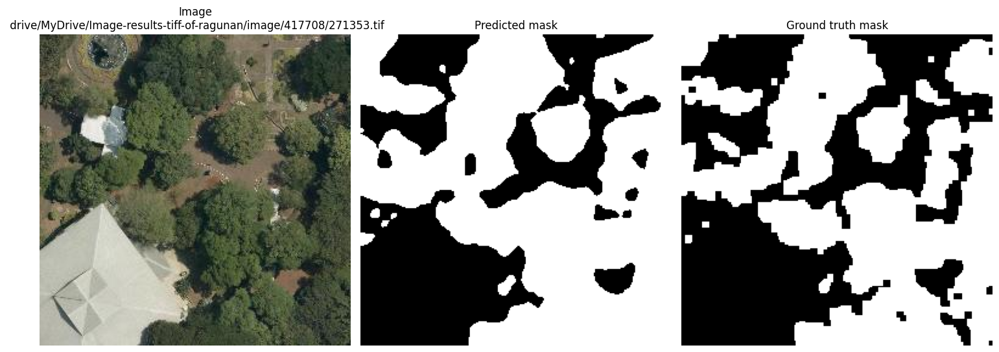

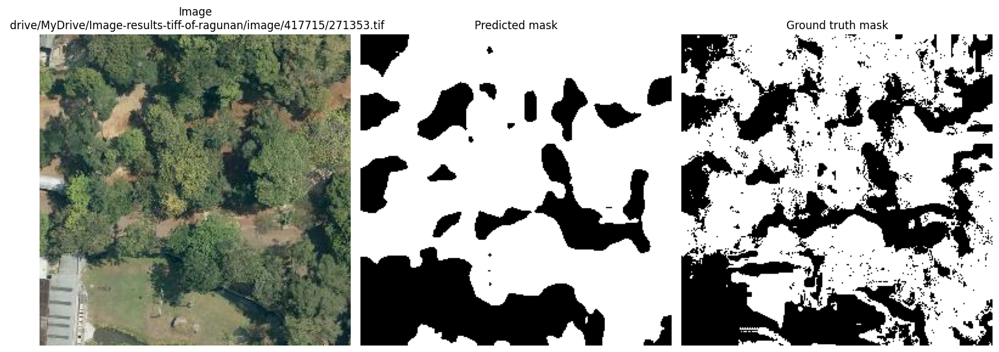

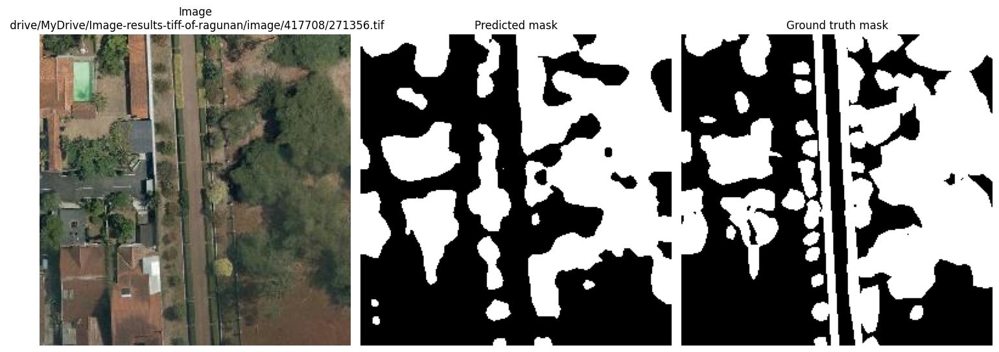

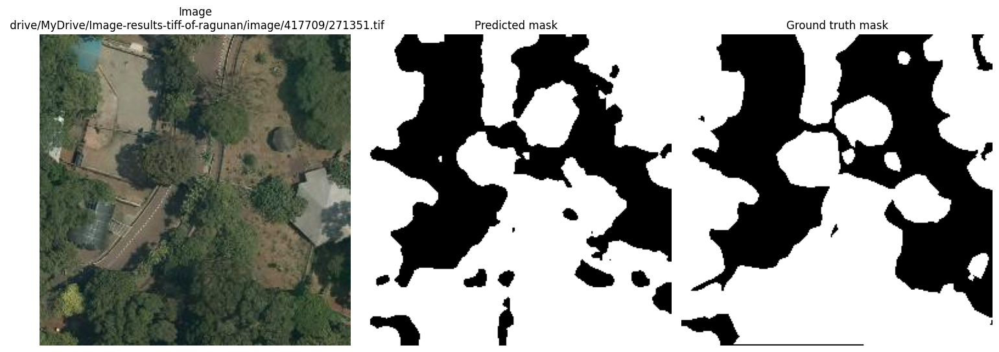

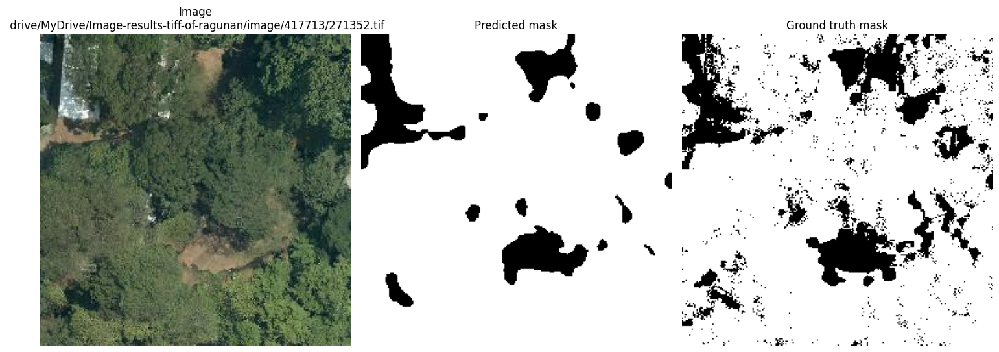

...

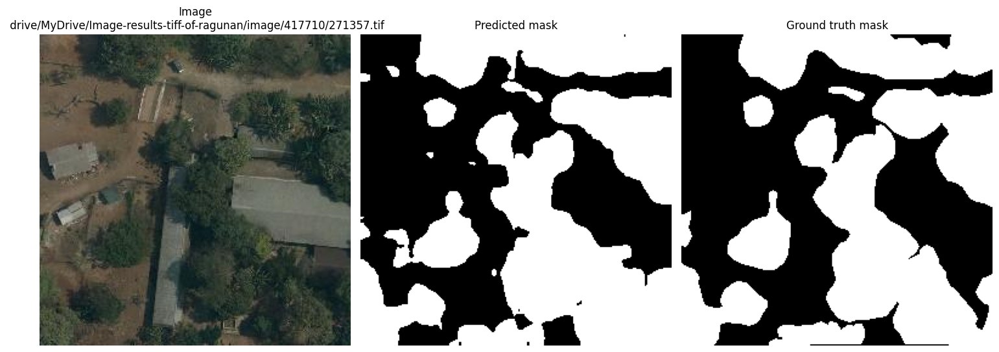

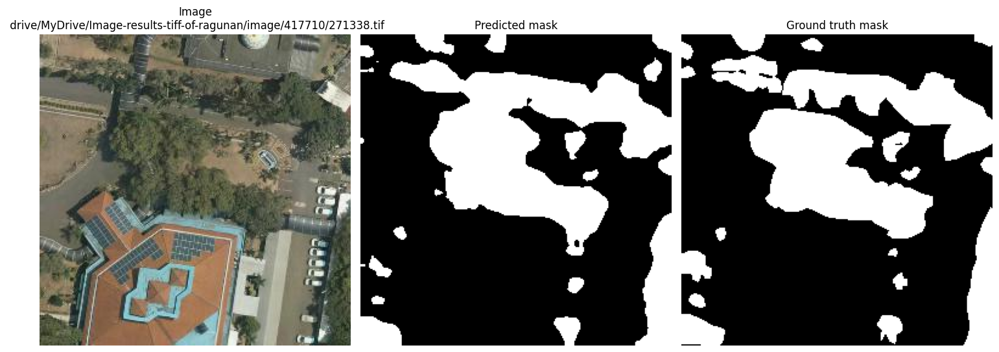

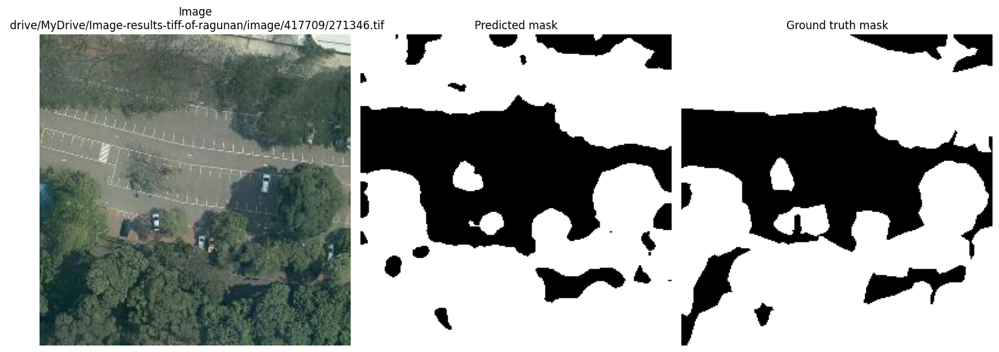

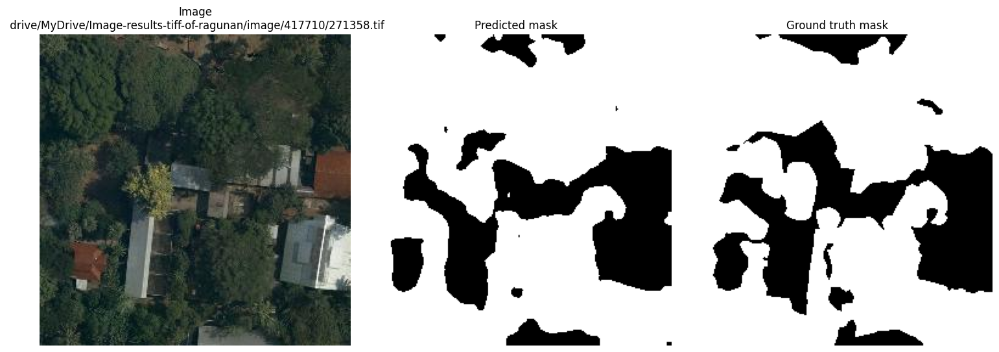

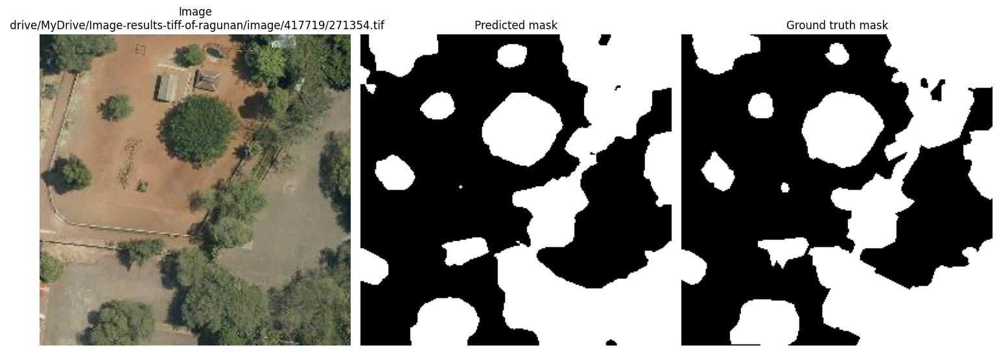

In [33]:
bin_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for images, masks, image_path, mask_path in test_loader:
        images = images.to(device)

        outputs = fine_tune_model(pixel_values = images)
        logits = outputs.logits

        upsampled_logits = F.interpolate(
            logits, size = masks.shape[-2:], mode = "bilinear", align_corners = False
        )

        probs = torch.softmax(upsampled_logits, dim = 1)
        preds = (probs[:, 1, :, :] > 0.5).cpu().numpy().astype(np.uint8) * 255

        for i in range(len(image_path)):
            img_path = image_path[i]
            mask_gt_path = mask_path[i]

            with rasterio.open(img_path) as src:
                img = src.read([1, 2, 3])
                img = np.transpose(img, (1, 2, 0))

            gt_mask = cv2.imread(mask_gt_path, cv2.IMREAD_GRAYSCALE)
            pred_mask = preds[i]

            bin_masks.append(pred_mask)
            gt_masks.append(gt_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(img)
            plt.title(f"Image\n {img_path}")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.imshow(pred_mask, cmap="gray")
            plt.title("Predicted mask")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap="gray")
            plt.title("Ground truth mask")
            plt.axis("off")

            plt.tight_layout()
            plt.show()

In [34]:
iou_score = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    bin_mask = bin_masks[i]
    gt_mask = gt_masks[i]

    pixels = np.sum(bin_mask > 0)
    veg_area = pixels * (GSD_x * GSD_y)

    iou = calculate_iou(bin_mask, gt_mask)

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou}")
    print("=========================")

    iou_score.append(iou)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

print("===========================")
print(f"Average IoU score: {np.mean(iou_score)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 40599
Vegetation coverage area: 22850.33163585425
IoU score: 0.8315228028968487
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 45000
Vegetation coverage area: 3496.856840201825
IoU score: 0.7569611836090101
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 28900
Vegetation coverage area: 16265.784484253007
IoU score: 0.7114688242616273
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 41285
Vegetation coverage area: 23236.4329561379
IoU score: 0.834846909300982
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 57933
Veget

In [44]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 22850.33163585425 m^2
Carbon density: 0.0070863721074975695 ton/m^2
Estimated carbon stock: 161.92595275138686 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3496.856840201825 m^2
Carbon density: 0.0070863721074975695 ton/m^2
Estimated carbon stock: 24.780028776318296 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 16265.784484253007 m^2
Carbon density: 0.0070863721074975695 ton/m^2
Estimated carbon stock: 115.26540147577724 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 23236.4329561379 m^2
Carbon density: 0.0070863721074975695 ton/m^2
Estimated carbon stock: 164.6620103781129 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
Vegetation coverage area: 4501.85349607583 m^2
Carbon density: 0.00